# Topic Modeling on Book Summaries
- This notebook applies topic modeling on book summaries.  We'd like to see how we can extract keywords/topics, and also cluster books together into groups based off summary descriptions.
- The summaries of about 2,600 books were scraped and parsed from Amazon.
- code taken from:
- https://ahmedbesbes.com/how-to-mine-newsfeed-data-and-extract-interactive-insights-in-python.html
- https://www.kaggle.com/thykhuely/mercari-interactive-eda-topic-modelling

In [1]:
import nltk
import string
import re
import numpy as np
import pandas as pd
import pickle
#import lda

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white")

from nltk.stem.porter import *
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction import stop_words

from collections import Counter
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
%matplotlib inline

import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show, output_notebook
#from bokeh.transform import factor_cmap

import warnings
warnings.filterwarnings('ignore')
import logging
logging.getLogger("lda").setLevel(logging.WARNING)

In [2]:
# load amazon front product page data
df = pd.read_excel('../data/all_amazon_front_page_[redacted]_final.xlsx')
df = df.drop_duplicates(subset='summary')
df.tail(2)

,isbn,price,rating,num_reviews,sales_rank,best_sellers_rank,price_source,genre,format,title,...,language,ISBN10,ISBN13,asin,summary,cover_image,editorial_reviews,bought_together,product_description,about_the_author
3158,9781619693395,19.98,4.1,334.0,2239278,['4504 Literature & Fiction > Genre Fiction > ...,new,Literature&Fiction‚Ä∫GenreFiction,Audio CD,Summerland: A Novel,...,English,1619693399,978-1619693395,1619693395,"A warm June evening, a local tradition: the st...",https://images-na.ssl-images-amazon.com/images...,Elin Hilderbrand lives on Nantucket with her h...,['This item:Summerland: A Novel by Elin Hilder...,About the Author ...,NaN
3165,9781619698147,19.98,3.9,204.0,8834576,"['133451 Mystery, Thriller & Suspense > Thrill...",list,"Mystery,Thriller&Suspense‚Ä∫Thrillers&Suspense",Audio CD,The 500: A Novel,...,English,1619698145,978-1619698147,1619698147,"A gripping thriller debut, set deep in the hea...",https://images-na.ssl-images-amazon.com/images...,Matthew Quirk studied history and literature a...,[],About the Author ...,NaN


In [3]:
df.dtypes

isbn                     int64
price                  float64
rating                 float64
num_reviews            float64
sales_rank              object
best_sellers_rank       object
price_source            object
genre                   object
format                  object
title                   object
pub_date                object
author                  object
num_formats            float64
bold_price             float64
savings                 object
num_pages               object
publisher               object
language                object
ISBN10                  object
ISBN13                  object
asin                     int64
summary                 object
cover_image             object
editorial_reviews       object
bought_together         object
product_description     object
about_the_author       float64
dtype: object

# EDA
- First, start with some EDA on sales rank data.

In [4]:
def to_int(x):
    try: return int(str(x).replace(',', ''))
    except ValueError: return -1
pos_df = df.copy()
pos_df['sales_rank'] = pos_df['sales_rank'].apply(to_int)
pos_df = pos_df[pos_df['sales_rank'] >= 0]

pos_df.sales_rank.describe().apply(lambda x: format(x, 'f'))

count        1017.000000
mean      1314796.632252
std       1461011.124832
min           136.000000
25%        317863.000000
50%        937441.000000
75%       1815746.000000
max      16223951.000000
Name: sales_rank, dtype: object

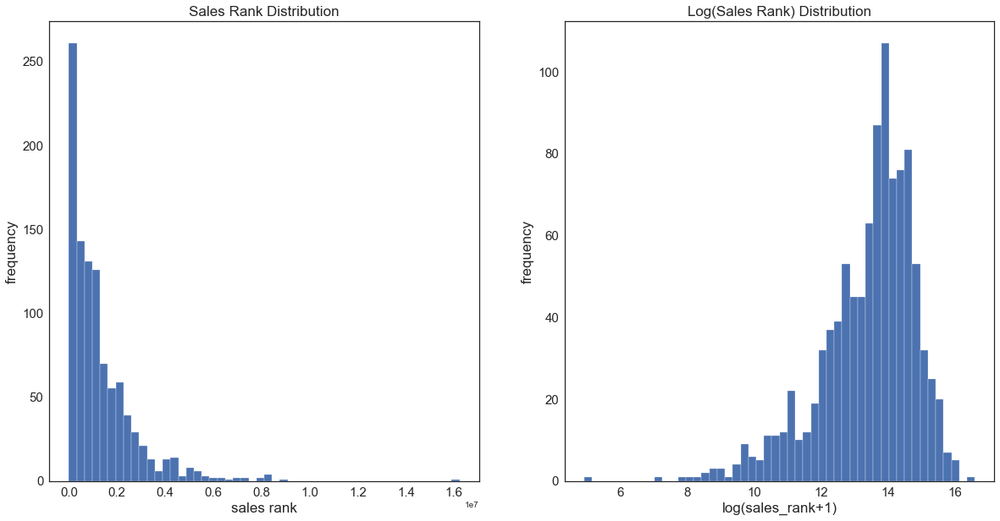

In [5]:
plt.subplot(1, 2, 1)
sales_rank = (pos_df['sales_rank'])
sales_rank.plot.hist(bins=50, figsize=(20,10), edgecolor='white')
plt.xlabel('sales rank', fontsize=17)
plt.ylabel('frequency', fontsize=17)
plt.tick_params(labelsize=15)
plt.title('Sales Rank Distribution', fontsize=17)

plt.subplot(1, 2, 2)
log_sales_rank = np.log(pos_df['sales_rank']+1)
log_sales_rank.plot.hist(bins=50, figsize=(20,10), edgecolor='white')
plt.xlabel('log(sales_rank+1)', fontsize=17)
plt.ylabel('frequency', fontsize=17)
plt.tick_params(labelsize=15)
plt.title('Log(Sales Rank) Distribution', fontsize=17)
plt.show()

- Notice that sales rank is right skewed, meaning that the corpus contains more books that are higher rank than books that are lower rank.
- After applying a log transformation, the distribution appears more normal.

# Kindle flag
- It's important to distinguish that the ranking system for books in Kindle format is separate from the ranking system used for books in other formats like print or audio.
- There are fewer items in Kindle rankings than in general book rankings, so the distribution of Kindle ranks is higher.

In [6]:
df['kindle'] = df['sales_rank'].apply(lambda x: 1 if 'Kindle' in str(x) else 0)
df.kindle.value_counts()/len(df)

1    0.617472
0    0.382528
Name: kindle, dtype: float64

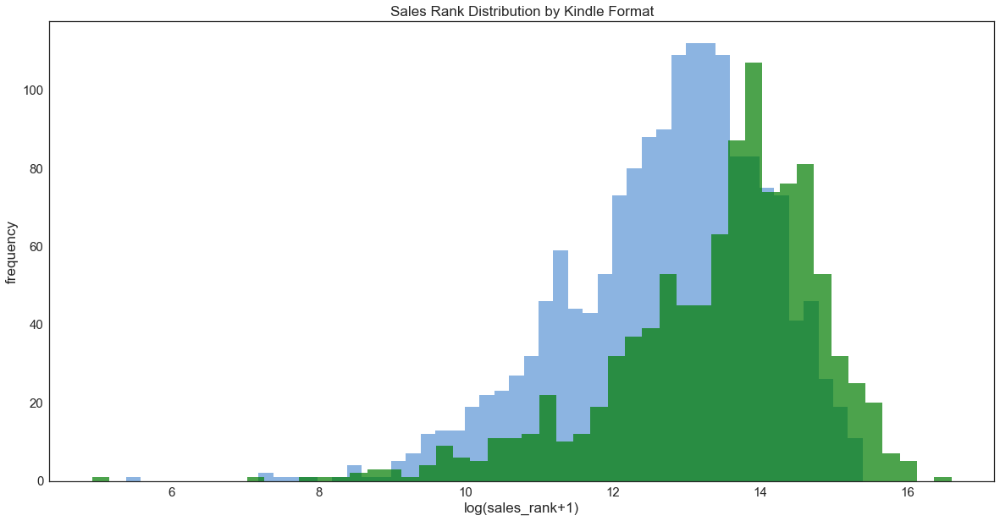

In [7]:
rank_kindle = df.loc[df.kindle==1, 'sales_rank'].apply(lambda x:x
                                                       .replace(' Paid in Kindle', '')
                                                       .replace(' Free in Kindle', '')
                                                       .replace(',', '')).apply(int)

t = df.loc[df.kindle==0, 'sales_rank'].apply(to_int)
rank_print = t[t > 0]

fig, ax = plt.subplots(figsize=(20,10))
ax.hist(np.log(rank_kindle+1), color='#8CB4E1', alpha=1.0, bins=50,
       label='Kindle Rank')
ax.hist(np.log(rank_print+1), color='#007D00', alpha=0.7, bins=50,
       label='Print Rank')
ax.set(title='Histogram Comparison', ylabel='% of Dataset in Bin')
plt.xlabel('log(sales_rank+1)', fontsize=17)
plt.ylabel('frequency', fontsize=17)
plt.title('Sales Rank Distribution by Kindle Format', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

>As expected, Kindle sales ranks (blue) lie higher than that of Print books (green).

# Genre
- Consider some summary statistics on genre.
- While the quality of the genre labels taken from Amazon are poor due to many books falling under broad categorizations such as KindleeLiterature&Fiction and Literature&Fiction‚Ä∫GenreFiction, we can still analyze some trends.

In [8]:
print("There are %d unique values in the genre column." % df['genre'].nunique())
print("There are %d books that do not have a genre label." % df['genre'].isnull().sum())
df['genre'].value_counts()[:30]

There are 76 unique values in the genre column.
There are 1 books that do not have a genre label.


KindleeLiterature&Fiction                         967
Literature&Fiction‚Ä∫GenreFiction                 400
Mystery,Thriller&Suspense‚Ä∫Thrillers&Suspense    226
Literature&Fiction‚Ä∫Women'sFiction               129
KindleeMystery,Thriller&Suspense                  127
KindleeScienceFiction&Fantasy                     114
KindleeRomance                                    110
Literature&Fiction‚Ä∫Action&Adventure              97
Literature&Fiction‚Ä∫UnitedStates                  73
Mystery,Thriller&Suspense‚Ä∫Mystery                53
KindleeReligion&Spirituality                       47
ScienceFiction&Fantasy‚Ä∫Fantasy                   34
Literature&Fiction‚Ä∫Erotica                       34
Humor&Entertainment‚Ä∫Humor                        28
ChristianBooks&Bibles‚Ä∫Literature&Fiction         28
ScienceFiction&Fantasy‚Ä∫ScienceFiction            28
KindleeTeen&YoungAdult                             26
Literature&Fiction‚Ä∫ShortStories&Anthologies      19
Literature&Fiction‚Ä∫WorldLi

In [9]:
# for x in df['best_sellers_rank'][:1]:
#     print(x.replace('[\'', '').replace('\']', '').split("', '").split())
# def split_best_sellers_rank(x):
#     try:
#         x.replace('[\'', '').replace('\']', '').split("', '")
#         return x.replace('[\'', '').replace('\']', '').split("', '")
# train['general_cat'], train['subcat_1'], train['subcat_2'] = \
# zip(*train['category_name'].apply(lambda x: split_cat(x)))

In [10]:
x = df['genre'].value_counts().index.values.astype('str')[1:20]
y = df['genre'].value_counts().values[1:20]
pct = [("%.2f"%(v*100))+"%"for v in (y/len(df))][1:20]

# trace1 = go.Bar(x=x, y=y, text=pct)
trace1 = go.Bar(x=x, y=y, text=pct,
                marker=dict(
                color = y,colorscale='Portland',showscale=True,
                reversescale = False
                ))
layout = dict(title= 'Number of Books by Genre',
              yaxis = dict(title='Count'),
              xaxis = dict(title='SubCategory'))
fig=dict(data=[trace1], layout=layout)
py.iplot(fig)

In [11]:
# Price Distribution by General Category

# general_cats = train['general_cat'].unique()
# x = [train.loc[train['general_cat']==cat, 'price'] for cat in general_cats]

# data = [go.Box(x=np.log(x[i]+1), name=general_cats[i]) for i in range(len(general_cats))]

# layout = dict(title="Price Distribution by General Category",
#               yaxis = dict(title='Frequency'),
#               xaxis = dict(title='Category'))
# fig = dict(data=data, layout=layout)
# py.iplot(fig)

# x = train['brand_name'].value_counts().index.values.astype('str')[:10]
# y = train['brand_name'].value_counts().values[:10]

# Summary
- Finally, begin processing the summary data.  Start by cleaning and preprocessing the text.

In [12]:
def wordCount(text):
    """
    strip out all punctuations and remove stop words
    """
    # convert to lower case and strip regex
    try:
         # convert to lower case and strip regex
        text = text.lower()
        regex = re.compile('[' +re.escape(string.punctuation) + '0-9\\r\\t\\n¬†]')
        txt = regex.sub(" ", text)
        # tokenize
        # words = nltk.word_tokenize(clean_txt)
        # remove words in stop words
        words = [w for w in txt.split(" ") \
                 if not w in stop_words.ENGLISH_STOP_WORDS]
        return len(words)
    except: 
        return 0
    
# # add a column of word counts to both the training and test set
# train['desc_len'] = train['item_description'].apply(lambda x: wordCount(x))
# test['desc_len'] = test['item_description'].apply(lambda x: wordCount(x))

# Average Log(Price) by Description Length

# df = train.groupby('desc_len')['price'].mean().reset_index()
# trace1 = go.Scatter(
#     x = df['desc_len'],
#     y = np.log(df['price']+1),
#     mode = 'lines+markers',
#     name = 'lines+markers'
# )
# layout = dict(title= 'Average Log(Price) by Description Length',
#               yaxis = dict(title='Average Log(Price)'),
#               xaxis = dict(title='Description Length'))
# fig=dict(data=[trace1], layout=layout)
# py.iplot(fig)

In [13]:
# number of observations missing summary
print(df.summary.isnull().sum())
# remove missing values in summary
summary_df = df[pd.notnull(df['summary'])]

1


In [14]:
# # create a dictionary of words for each category
# cat_desc = dict()
# for cat in general_cats: 
#     text = " ".join(train.loc[train['general_cat']==cat, 'item_description'].values)
#     cat_desc[cat] = tokenize(text)

# # flat list of all words combined
# flat_lst = [item for sublist in list(cat_desc.values()) for item in sublist]
# allWordsCount = Counter(flat_lst)
# all_top10 = allWordsCount.most_common(20)
# x = [w[0] for w in all_top10]
# y = [w[1] for w in all_top10]

# trace1 = go.Bar(x=x, y=y, text=pct)
# layout = dict(title= 'Word Frequency',
#               yaxis = dict(title='Count'),
#               xaxis = dict(title='Word'))
# fig=dict(data=[trace1], layout=layout)
# py.iplot(fig)

# Pre-processing: tokenization
    break the descriptions into sentences and then break the sentences into tokens
    remove punctuation and stop words
    lowercase the tokens
    only consider words that have length equal to or greater than 3 characters

In [15]:
# from nltk.stem import PorterStemmer

WORDS_TO_IGNORE = ['bestseller', 'world', 'life', 'one', 'new', 'time', 'york', 'find', 'author', 'novel', 'years', 'never', 'first', 'must', 'times', 'story', 'two', 'back', 'even', 'bestselling', 'ever', 'like', 'series', 'way', 'book', 'best', 'knows', 'last', 'long', 'could', 'make', 'may', 'soon', 'yet', 'everything', 'finds', 'year', 'day']


stop = set(stopwords.words('english'))
stop_ignore = stop.union(set(WORDS_TO_IGNORE))

# ps = PorterStemmer()

def tokenize(text):
    """
    sent_tokenize(): segment text into sentences
    word_tokenize(): break sentences into words
    """
    try: 
        regex = re.compile('[' +re.escape(string.punctuation) + '0-9\\r\\t\\n]')
        text = regex.sub(" ", text) # remove punctuation
        
        tokens_ = [word_tokenize(s) for s in sent_tokenize(text)]
        tokens = []
        for token_by_sent in tokens_:
            tokens += token_by_sent
        tokens = list(filter(lambda t: t.lower() not in stop_ignore, tokens))
        filtered_tokens = [w for w in tokens if re.search('[a-zA-Z]', w)]
        filtered_tokens = [w.lower() for w in filtered_tokens if len(w)>=3]
        
        return filtered_tokens
            
    except TypeError as e: print(text,e)

In [16]:
# apply the tokenizer into the summary column
summary_df['tokens'] = summary_df['summary'].map(tokenize)
summary_df.reset_index(drop=True, inplace=True)

In [17]:
for summary, tokens in zip(summary_df['summary'].tail(1), summary_df['tokens'].tail(1)):
    print('summary:', summary)
    print('tokens:', tokens)
    print()

summary: A gripping thriller debut, set deep in the heart of the world's most powerful political arena A year ago, fresh out of Harvard Law School, Mike Ford landed his dream job at the Davies Group, Washington's most powerful consulting firm. Now, he's staring down the barrel of a gun, pursued by two of the world's most dangerous men. To get out, he'll have to do all the things he thought he'd never do again: lie, cheat, steal-and this time, maybe even kill. Mike grew up in a world of small-stakes con men, learning lessons at his father's knee. His hard-won success in college and law school was his ticket out. As the Davies Group's rising star, he rubs shoulders with "The 500," the elite men and women who really run Washington -- and the world. But peddling influence, he soon learns, is familiar work: even with a pedigree, a con is still a con. Combining the best elements of political intrigue and heart-stopping action, THE 500 is an explosive debut, one that calls to mind classic thr

### use the package WordCloud to easily visualize which words has the highest frequencies within each category

In [18]:
# build dictionary with key=genre and values as all the summaries related.
genre_desc = dict()

genres = set(summary_df['genre'])

for genre in genres: 
    text = " ".join(summary_df.loc[summary_df['genre']==genre, 'summary'].values)
    genre_desc[genre] = tokenize(text)


# find the most common words for the top 4 genres
kindle_fiction100 = Counter(genre_desc['KindleeLiterature&Fiction']).most_common(100)
fiction100 = Counter(genre_desc['Literature&Fiction‚Ä∫GenreFiction']).most_common(100)
thrillers_suspense100 = Counter(genre_desc['Mystery,Thriller&Suspense‚Ä∫Thrillers&Suspense']).most_common(100)
womens100 = Counter(genre_desc['Literature&Fiction‚Ä∫Women\'sFiction']).most_common(100)

Text(0.5,1,"Women's Fiction Top 100")

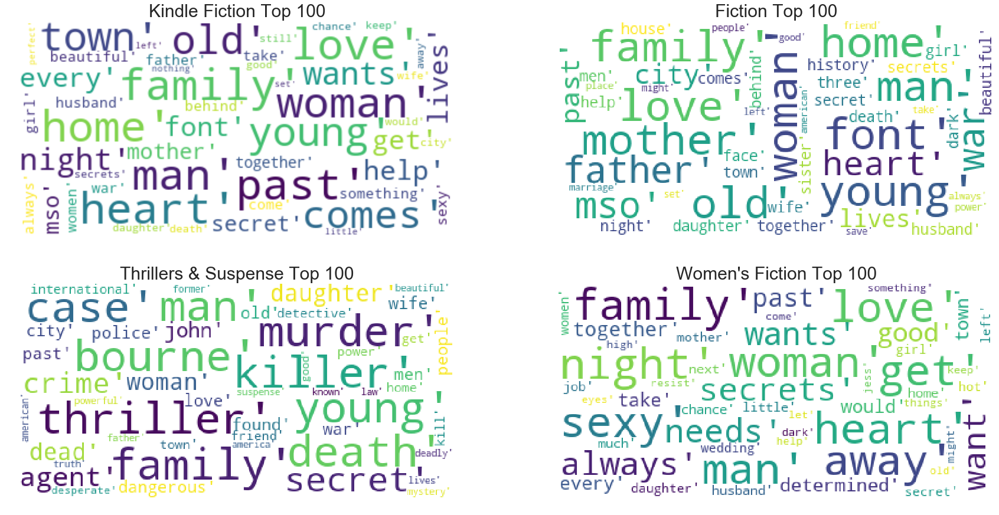

In [19]:
def generate_wordcloud(tup):
    wordcloud = WordCloud(background_color='white',
                          max_words=50, max_font_size=40,
                          random_state=42
                         ).generate(str(tup))
    return wordcloud


fig,axes = plt.subplots(2, 2, figsize=(30, 15))

ax = axes[0, 0]
ax.imshow(generate_wordcloud(kindle_fiction100), interpolation="bilinear")
ax.axis('off')
ax.set_title("Kindle Fiction Top 100", fontsize=30)

ax = axes[0, 1]
ax.imshow(generate_wordcloud(fiction100))
ax.axis('off')
ax.set_title("Fiction Top 100", fontsize=30)

ax = axes[1, 0]
ax.imshow(generate_wordcloud(thrillers_suspense100))
ax.axis('off')
ax.set_title("Thrillers & Suspense Top 100", fontsize=30)

ax = axes[1, 1]
ax.imshow(generate_wordcloud(womens100))
ax.axis('off')
ax.set_title("Women's Fiction Top 100", fontsize=30)

# Pre-processing: tf-idf

tf-idf is the acronym for Term Frequency–inverse Document Frequency. It quantifies the importance of a particular word relative to the vocabulary of a collection of documents or corpus. The metric depends on two factors:

    Term Frequency: the occurences of a word in a given document (i.e. bag of words)
    Inverse Document Frequency: the reciprocal number of times a word occurs in a corpus of documents

Think about of it this way: If the word is used extensively in all documents, its existence within a specific document will not be able to provide us much specific information about the document itself. So the second term could be seen as a penalty term that penalizes common words such as "a", "the", "and", etc. tf-idf can therefore, be seen as a weighting scheme for words relevancy in a specific document.


In [20]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,
                             max_features=180000,
                             tokenizer=tokenize,
#                              ngram_range=(1, 2)
                            )

# all_desc = np.append(train['item_description'].values, test['item_description'].values)
all_summary = summary_df['summary'].values
vz = vectorizer.fit_transform(list(all_summary))

vz is a tfidf matrix where:

    the number of rows is the total number of summaries
    the number of columns is the total number of unique tokens across the summaries

In [21]:
#  create a dictionary mapping the tokens to their tfidf values
tfidf = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))

tfidf = pd.DataFrame(columns=['tfidf']).from_dict(
                    dict(tfidf), orient='index')
tfidf.columns = ['tfidf']

Below are the 10 tokens with the lowest tfidf score, generic words that we could not use to distinguish one summary from another.

In [22]:
tfidf.sort_values(by=['tfidf'], ascending=True).head(10)

# life | man | love | family | trent | good | world | sexy | woman | heart | something | come | mission | away | home

,tfidf
love,2.274560
man,2.364962
family,2.465965
woman,2.678696
heart,2.854664
young,2.878703
home,2.890943
past,2.895882
old,2.918411
lives,3.095178


Below are the 10 tokens with the highest tfidf score(tokens with the same low frequency count all have the same tf-idf score), which includes words that are specific.

In [23]:
tfidf.sort_values(by=['tfidf'], ascending=False).head(10)

,tfidf
rescuing,6.499401
stick,6.499401
stops,6.499401
parks,6.499401
stress,6.499401
grandson,6.499401
strictly,6.499401
stroke,6.499401
package,6.499401
essence,6.499401


# t-SNE
- dimensionality reduction technique to visualize in 2D or 3D space

In [24]:
smry = summary_df.copy()
sample_sz = len(smry)

sample = smry.sample(n=sample_sz)
vz_sample = vectorizer.fit_transform(list(sample['summary']))

from sklearn.decomposition import TruncatedSVD

n_comp=30
svd = TruncatedSVD(n_components=n_comp, random_state=42)
svd_tfidf = svd.fit_transform(vz_sample)

# reduce dimension from 30 to 2 using t-SNE
from sklearn.manifold import TSNE
tsne_model = TSNE(n_components=2, verbose=1, random_state=42, n_iter=500)

tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2689 samples in 0.002s...
[t-SNE] Computed neighbors for 2689 samples in 0.481s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2689
[t-SNE] Computed conditional probabilities for sample 2000 / 2689
[t-SNE] Computed conditional probabilities for sample 2689 / 2689
[t-SNE] Mean sigma: 0.069358
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.956108
[t-SNE] Error after 500 iterations: 1.743984


# visualize data points
Note that the deviation as well as the size of the clusters imply little information in t-SNE.

In [25]:
output_notebook()
plot_tfidf = bp.figure(plot_width=700, plot_height=600,
                       title="tf-idf clustering of the item description",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

sample.reset_index(inplace=True, drop=True)

tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])
tfidf_df['summary'] = sample['summary']
tfidf_df['tokens'] = sample['tokens']
tfidf_df['genre'] = sample['genre']

plot_tfidf.scatter(x='x', y='y', source=tfidf_df, alpha=0.7)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"summary": "@summary", "tokens": "@tokens", "genre":"@genre"}
show(plot_tfidf)

Loading BokehJS ...

# K-Means Clustering
K-means clustering's objective is to minimize the average squared Euclidean distance of the document from their cluster centroids.

In [26]:
from sklearn.cluster import MiniBatchKMeans

num_clusters = 30 # need to be selected wisely
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               n_init=1,
                               init_size=1000, batch_size=1000, verbose=0, max_iter=1000)

kmeans = kmeans_model.fit(vz)
kmeans_clusters = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)

sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()

for i in range(num_clusters):
    print("Cluster %d:" % i)
    aux = ''
    for j in sorted_centroids[i, :10]:
        aux += terms[j] + ' | '
    print(aux)
    print() 

Cluster 0:
sam | brother | stop | killer | things | samantha | mother | giving | father | gets | 

Cluster 1:
jane | belgravia | secret | week | ball | richmond | rub | duchess | waterloo | nicole | 

Cluster 2:
award | books | national | finalist | post | top | lucy | women | winning | american | 

Cluster 3:
case | crime | killer | detective | police | murder | thriller | found | young | investigation | 

Cluster 4:
stories | collection | short | strand | penthouse | letters | magazine | erotic | writers | american | 

Cluster 5:
vampire | john | queen | magic | fantasy | charming | death | history | knight | epic | 

Cluster 6:
cowboy | ranch | wild | heart | sweet | love | family | beautiful | texas | rita | 

Cluster 7:
inheritance | mira | trilogy | kingdom | short | grant | newsflesh | check | broken | fifth | 

Cluster 8:
hamish | macbeth | raisin | agatha | constable | television | death | scotland | village | policeman | 

Cluster 9:
travel | discovered | century | crafted | 

In order to plot these clusters, first we will need to reduce the dimension of the distances to 2 using tsne:

In [27]:
# repeat the same steps for the sample
kmeans = kmeans_model.fit(vz_sample)
kmeans_clusters = kmeans.predict(vz_sample)
kmeans_distances = kmeans.transform(vz_sample)
# reduce dimension to 2 using tsne
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2689 samples in 0.003s...
[t-SNE] Computed neighbors for 2689 samples in 0.466s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2689
[t-SNE] Computed conditional probabilities for sample 2000 / 2689
[t-SNE] Computed conditional probabilities for sample 2689 / 2689
[t-SNE] Mean sigma: 0.013729
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.197014
[t-SNE] Error after 500 iterations: 1.471724


In [28]:
colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c", "#c84dc9", "#68af4e", "#6e6cd5",
"#e3be38", "#4e2d7c", "#5fdfa8", "#d34690", "#3f6d31", "#d44427", "#7fcdd8", "#cb4053", "#5e9981",
"#803a62", "#9b9e39", "#c88cca", "#e1c37b", "#34223b", "#bdd8a3", "#6e3326", "#cfbdce", "#d07d3c",
"#52697d", "#194196", "#d27c88", "#36422b", "#b68f79"])

#combined_sample.reset_index(drop=True, inplace=True)
kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters
kmeans_df['summary'] = sample['summary']
kmeans_df['genre'] = sample['genre']
#kmeans_df['cluster']=kmeans_df.cluster.astype(str).astype('genre')

plot_kmeans = bp.figure(plot_width=700, plot_height=600,
                        title="KMeans clustering of the summary",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

source = ColumnDataSource(data=dict(x=kmeans_df['x'], y=kmeans_df['y'],
                                    color=colormap[kmeans_clusters],
                                    summary=kmeans_df['summary'],
                                    genre=kmeans_df['genre'],
                                    cluster=kmeans_df['cluster']))

plot_kmeans.scatter(x='x', y='y', color='color', source=source)
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"summary": "@summary", "genre": "@genre", "cluster":"@cluster" }
show(plot_kmeans)

# Latent Dirichlet Allocation
    LDA starts from a fixed number of topics. Each topic is represented as a distribution over words, and each document is then represented as a distribution over topics. Although the tokens themselves are meaningless, the probability distributions over words provided by the topics provide a sense of the different ideas contained in the documents.

    Reference: https://medium.com/intuitionmachine/the-two-paths-from-natural-language-processing-to-artificial-intelligence-d5384ddbfc18

Its input is a bag of words, i.e. each document represented as a row, with each columns containing the count of words in the corpus. We are going to use a powerful tool called pyLDAvis that gives us an interactive visualization for LDA.

### LDA on count vectorizer

In [29]:
cvectorizer = CountVectorizer(min_df=4,
                              max_features=180000,
                              tokenizer=tokenize,
                              ngram_range=(1,2))

cvz = cvectorizer.fit_transform(sample['summary'])

lda_model = LatentDirichletAllocation(n_components=20,
                                      learning_method='online',
                                      max_iter=20,
                                      random_state=42)

X_topics = lda_model.fit_transform(cvz)

n_top_words = 15
topic_summaries = []

topic_word = lda_model.components_  # get the topic words
vocab = cvectorizer.get_feature_names()

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' | '.join(topic_words)))

Topic 0: five old | case | sam | stories | jane | thriller | david | detective | books | mystery | readers | sophie | read | sharon | crime
Topic 1: room | jack | love | old | five | nick | tale | child | much | night | building | four | son | hard | major
Topic 2: castle | rebus | twin | karina | bramble | policeman | hope | identical | scotland | get bottom | twin sister | edinburgh | slate | decker | beaton
Topic 3: space | secret | alien | belgravia | charles | behind | complete | dickens | week | galaxy | unravels | london | gavin | battle | characters
Topic 4: man | death | war | past | help | dangerous | dark | murder | secret | dead | young | family | killer | truth | save
Topic 5: award | winning | stories | award winning | collection | leo | winner | short | tom | annie | witcher | finalist | tales | ten | fiction
Topic 6: sean | harper | fashion | penny | spell | elin | summer | nantucket | drummond | inherited | frost | elin hilderbrand | hilderbrand | twin | tabitha
Topic 

In [30]:
# reduce dimension to 2 using tsne
tsne_lda = tsne_model.fit_transform(X_topics)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2689 samples in 0.002s...
[t-SNE] Computed neighbors for 2689 samples in 0.291s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2689
[t-SNE] Computed conditional probabilities for sample 2000 / 2689
[t-SNE] Computed conditional probabilities for sample 2689 / 2689
[t-SNE] Mean sigma: 0.074886
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.998306
[t-SNE] Error after 500 iterations: 1.047002


In [31]:
unnormalized = np.matrix(X_topics)
doc_topic = unnormalized/unnormalized.sum(axis=1)

lda_keys = []
for i, tweet in enumerate(sample['summary']):
    lda_keys += [doc_topic[i].argmax()]

lda_df = pd.DataFrame(tsne_lda, columns=['x','y'])
lda_df['summary'] = sample['summary']
lda_df['genre'] = sample['genre']
lda_df['lda_topic'] = lda_keys
lda_df['lda_topic'] = lda_df['lda_topic'].map(int)

plot_lda = bp.figure(plot_width=700,
                     plot_height=600,
                     title="LDA topic visualization",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)


source = ColumnDataSource(data=dict(x=lda_df['x'], y=lda_df['y'],
                                    color=colormap[lda_keys],
                                    summary=lda_df['summary'],
                                    topic=lda_df['lda_topic'],
                                    genre=lda_df['genre']))

plot_lda.scatter(source=source, x='x', y='y', color='color')
hover = plot_kmeans.select(dict(type=HoverTool))
hover = plot_lda.select(dict(type=HoverTool))
hover.tooltips={"summary":"@summary",
                "topic":"@topic", "genre":"@genre"}
show(plot_lda)

In [32]:
lda_df['lda_topic'].value_counts()

4     1066
16     706
15     522
0      117
9       80
12      34
11      30
5       24
3       21
1       20
18      15
10      14
19      12
13      11
14       5
8        4
6        4
17       3
2        1
Name: lda_topic, dtype: int64

In [33]:
def prepareLDAData():
    data = {
        'vocab': vocab,
        'doc_topic_dists': doc_topic,
        'doc_lengths': list(lda_df['len_docs']),
        'term_frequency':cvectorizer.vocabulary_,
        'topic_term_dists': lda_model.components_
    } 
    return data

Note: It's a shame that by putting the HTML of the visualization using pyLDAvis, it will distort the layout of the kernel, I won't upload in here. But if you follow the below code, there should be an HTML file generated with very interesting interactive bubble chart that visualizes the space of your topic clusters and the term components within each topic.


http://nbviewer.jupyter.org/github/bmabey/pyLDAvis/blob/master/notebooks/pyLDAvis_overview.ipynb#topic=0&lambda=1&term=

In [34]:
import pyLDAvis

lda_df['len_docs'] = sample['tokens'].map(len)
ldadata = prepareLDAData()
pyLDAvis.enable_notebook()
prepared_data = pyLDAvis.prepare(**ldadata)
pyLDAvis.display(prepared_data)

- the pyLDAvis topics don't seem to match what's printed above

In [35]:
# lda_df.sort_values(by='topic')
lda_df[lda_df['lda_topic'] == 4]

,x,y,summary,genre,lda_topic,len_docs
5,-21.694393,16.887207,FBI Special agent Brad Raines is facing his to...,"Mystery,Thriller&Suspense‚Ä∫Thrillers&Suspense",4,132
9,-39.691074,2.520650,In the third novel by the author of Blacker Th...,KindleeLiterature&Fiction,4,19
11,8.667905,11.114226,Maybe you know Amanda. Maybe you are Amanda. W...,Literature&Fiction‚Ä∫Contemporary,4,101
23,-21.043339,25.919813,"In Feierabiand, in the wide green Delta, far f...",Literature&Fiction‚Ä∫Action&Adventure,4,53
24,-51.747124,8.084187,L.A. private eye Elvis Cole is hired by popula...,"Mystery,Thriller&Suspense‚Ä∫Mystery",4,55
31,-25.105387,-2.116569,"The Compact of Sorcerers, a brotherhood sworn ...",KindleeLiterature&Fiction,4,91
36,-53.413700,8.918884,"""Beautifully written. Shana Figueroa is an exc...",KindleeLiterature&Fiction,4,80
41,-52.608372,8.635947,In a universe where corruption and deception r...,ScienceFiction&Fantasy‚Ä∫Fantasy,4,79
46,-20.308767,0.655105,They were once orphans from London's roughest ...,KindleeRomance,4,120
48,-4.021246,28.708210,It was supposed to be only a temporary job--so...,"Mystery,Thriller&Suspense‚Ä∫Mystery",4,75


# NMF on count vectorizer and tf-idf vector
- Non-Negative Matrix Factorization

### NMF on count vectorizer

In [36]:
from sklearn.decomposition import NMF

model = NMF(init="nndsvd",
            n_components=20,
            max_iter=200)

a = cvectorizer.fit_transform(summary_df.summary)
W = model.fit_transform(a)
H = model.components_

terms = [""] * len(cvectorizer.vocabulary_)
for term in cvectorizer.vocabulary_.keys():
    terms[cvectorizer.vocabulary_[term]] = term

for topic_index in range(H.shape[0]):  # H.shape[0] is k
    top_indices = np.argsort(H[topic_index,:])[::-1][0:10]
    term_ranking = [terms[i] for i in top_indices]
    print("Topic {}: {}".format(topic_index, ", ".join(term_ranking)))

Topic 0: font, mso, font family, family, mso font, size, margin, style, font size, mso style
Topic 1: get, sexy, wants, town, night, little, heart, needs, hot, chance
Topic 2: riyria, revelations¬†, riyria revelations¬†, chronicles, riyria chronicles, crown, michael, books, empire, fantasy
Topic 3: affairthe, kismet, valentine, omnibus, jill, jill kismet, city, lilith, lilith saintcrow, saintcrow
Topic 4: war, lazarus, battle, expanse, space, epic, alien, fiction, lazarus war, adventure
Topic 5: family, home, secrets, sister, daughter, lives, children, marriage, son, good
Topic 6: secret, belgravia, behind, week, london, society, ball, duchess, richmond, duchess richmond
Topic 7: love, heart, together, passion, true, chance, away, lost, fall, comes
Topic 8: crime, case, killer, murder, police, town, detective, louise, thriller, death
Topic 9: man, wants, jesse, ava, night, seems, known, beneath, wife, know
Topic 10: bourne, karpov, jason, jason bourne, soraya, friend, secret, agent, da

### NMF on tf-idf vectorizer

In [37]:
a = vectorizer.fit_transform(summary_df.summary)
W = model.fit_transform(a)
H = model.components_

terms = [""] * len(vectorizer.vocabulary_)
for term in vectorizer.vocabulary_.keys():
    terms[vectorizer.vocabulary_[term]] = term

for topic_index in range(H.shape[0]):  # H.shape[0] is k
    top_indices = np.argsort(H[topic_index,:])[::-1][0:10]
    term_ranking = [terms[i] for i in top_indices]
    print("Topic {}: {}".format(topic_index, ", ".join(term_ranking)))

Topic 0: get, job, sexy, hot, things, bad, good, needs, little, wants
Topic 1: war, expanse, earth, space, extinction, alien, fiction, battle, army, planet
Topic 2: font, mso, margin, family, size, style, wordsection, msonormal, variable, panose
Topic 3: affairthe, kismet, valentine, omnibus, jill, saintcrow, lilith, dante, gallow, arquitaine
Topic 4: killer, crime, case, murder, police, detective, thriller, investigation, death, victim
Topic 5: family, mother, father, home, old, daughter, young, lives, marriage, children
Topic 6: belgravia, secret, week, richmond, duchess, ball, behind, waterloo, london, eve
Topic 7: hamish, macbeth, raisin, agatha, constable, television, death, village, policeman, scotland
Topic 8: stories, collection, short, american, books, strand, award, characters, featuring, mystery
Topic 9: love, man, woman, passion, heart, lady, desire, beautiful, every, danger
Topic 10: bourne, jason, eric, agent, van, memory, robert, feared, terrorist, moore
Topic 11: james,

In [38]:
unnormalized = np.matrix(W)
doc_topic = unnormalized/unnormalized.sum(axis=1)

nmf_keys = []
for i, tweet in enumerate(sample['summary']):
    nmf_keys += [doc_topic[i].argmax()]

# lda_df = pd.DataFrame(tsne_lda, columns=['x','y'])
lda_df['summary'] = sample['summary']
lda_df['genre'] = sample['genre']
lda_df['nmf_topic'] = nmf_keys
lda_df['nmf_topic'] = lda_df['nmf_topic'].map(int)

lda_df['nmf_topic'].value_counts()

5     415
0     364
4     321
9     297
8     227
1     206
19    154
12    145
18    128
14     96
17     63
11     53
15     44
13     36
6      28
16     25
7      24
2      24
3      21
10     18
Name: nmf_topic, dtype: int64

In [39]:
topic_df = pd.merge(summary_df, lda_df[['summary', 'lda_topic', 'nmf_topic']], on='summary')[['isbn',
 'nmf_topic',
 'lda_topic',
 'title',
 'author',
 'summary',
 'genre',
 'best_sellers_rank',
 'sales_rank',
 'price',
 'rating',
 'num_reviews',
 'price_source',
 'format',
 'pub_date',
 'num_formats',
 'bold_price',
 'savings',
 'num_pages',
 'publisher',
 'language',
 'ISBN10',
 'ISBN13',
 'asin',
 'cover_image',
 'editorial_reviews',
 'bought_together',
 'product_description',
 'about_the_author',
 'kindle',
 'tokens']].sort_values(by=['nmf_topic', 'title']).drop_duplicates(subset='isbn')
topic_df.to_excel('../data/summary_topics.xlsx')

### LDA on Count Vectorizer

In [40]:
cvectorizer = CountVectorizer(min_df=4,
                              max_features=180000,
                              tokenizer=tokenize,
                              ngram_range=(1,2))

cvz = cvectorizer.fit_transform(sample['summary'])

# lda_model = LatentDirichletAllocation(n_components=20,
#                                       learning_method='online',
#                                       max_iter=20,
#                                       random_state=42)

X_topics = lda_model.fit_transform(cvz)

n_top_words = 15
topic_summaries = []

topic_word = lda_model.components_  # get the topic words
vocab = cvectorizer.get_feature_names()

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' | '.join(topic_words)))

Topic 0: five old | case | sam | stories | jane | thriller | david | detective | books | mystery | readers | sophie | read | sharon | crime
Topic 1: room | jack | love | old | five | nick | tale | child | much | night | building | four | son | hard | major
Topic 2: castle | rebus | twin | karina | bramble | policeman | hope | identical | scotland | get bottom | twin sister | edinburgh | slate | decker | beaton
Topic 3: space | secret | alien | belgravia | charles | behind | complete | dickens | week | galaxy | unravels | london | gavin | battle | characters
Topic 4: man | death | war | past | help | dangerous | dark | murder | secret | dead | young | family | killer | truth | save
Topic 5: award | winning | stories | award winning | collection | leo | winner | short | tom | annie | witcher | finalist | tales | ten | fiction
Topic 6: sean | harper | fashion | penny | spell | elin | summer | nantucket | drummond | inherited | frost | elin hilderbrand | hilderbrand | twin | tabitha
Topic 

### LDA on tf-idf


In [41]:
vz = vectorizer.fit_transform(sample['summary'])

X_topics = lda_model.fit_transform(vz)

n_top_words = 15
topic_summaries = []

topic_word = lda_model.components_  # get the topic words
vocab = vectorizer.get_feature_names()

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' | '.join(topic_words)))

Topic 0: francisco | reign | end | duke | challenge | dog | faces | assassins | people | cities | terror | kingdom | million | least | resistance
Topic 1: alexander | alex | great | graduate | harvard | famed | halls | adventure | program | egypt | riveting | prisoner | university | king | prize
Topic 2: sharon | strand | mccone | mulholland | originals | mulhollandbooks | archives | names | featuring | view | marcia | short | private | investigator | beloved
Topic 3: laura | four | beast | journey | mother | soldiers | legend | olivia | rose | woman | sophie | captured | harbor | stunning | runs
Topic 4: jane | kate | killer | face | beautiful | sharon | grace | takes | hearts | vegas | peter | boyfriend | pastor | wedding | bride
Topic 5: affairthe | kismet | valentine | mira | lilith | omnibus | saintcrow | newsflesh | jill | dante | grant | check | ripper | bandit | gallow
Topic 6: font | hamish | mso | macbeth | margin | agatha | raisin | constable | television | size | auto | sty

- Out of the four permutations, I like NMF on tf-idf vectorizer the best.

# Next Steps:
# Content
    - apply topic modeling to the text itself
    aws s3 cp s3://[redacted]-private-data/all_[redacted]_txt ./ --recursive
    aws s3 sync s3://[redacted]-private-data/all_[redacted]_txt .

In [42]:
# remove duplicate texts by analyzing the longest common substring
# itertools.combinations(iterable, r)

# all_pairs = []
# key_books
# for ii in range(len(key_books)):
#     for jj in range(ii):
#         all_pairs.append(key_books[ii],key_books[jj])